## Imports, Loading data

Full notebook with visible Profile Report on Google Collab: https://colab.research.google.com/drive/17aPDTNg5gRkJpmgoX6fwgK0RXIRGsisl

In [1]:
import pandas as pd 
import numpy as np 
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import seaborn as sns
import pickle
%matplotlib inline

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv')

In [3]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


## Basic info of the data

In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

> Many zeros, which shouldn't be there. We'll update zeros in some columns with mean. 

In [5]:
df['BMI'] = df['BMI'].replace(0, df['BMI'].mean())
df['BloodPressure'] = df['BloodPressure'].replace(0, df['BloodPressure'].mean())
df['Insulin'] = df['Insulin'].replace(0, df['Insulin'].mean())
df['Glucose'] = df['Glucose'].replace(0, df['Glucose'].mean())
df['SkinThickness'] = df['SkinThickness'].replace(0, df['SkinThickness'].mean())

> Checking results of the transformations in the Profile Report

In [6]:
#ProfileReport(df)

> Checking for outliers. 

<AxesSubplot:>

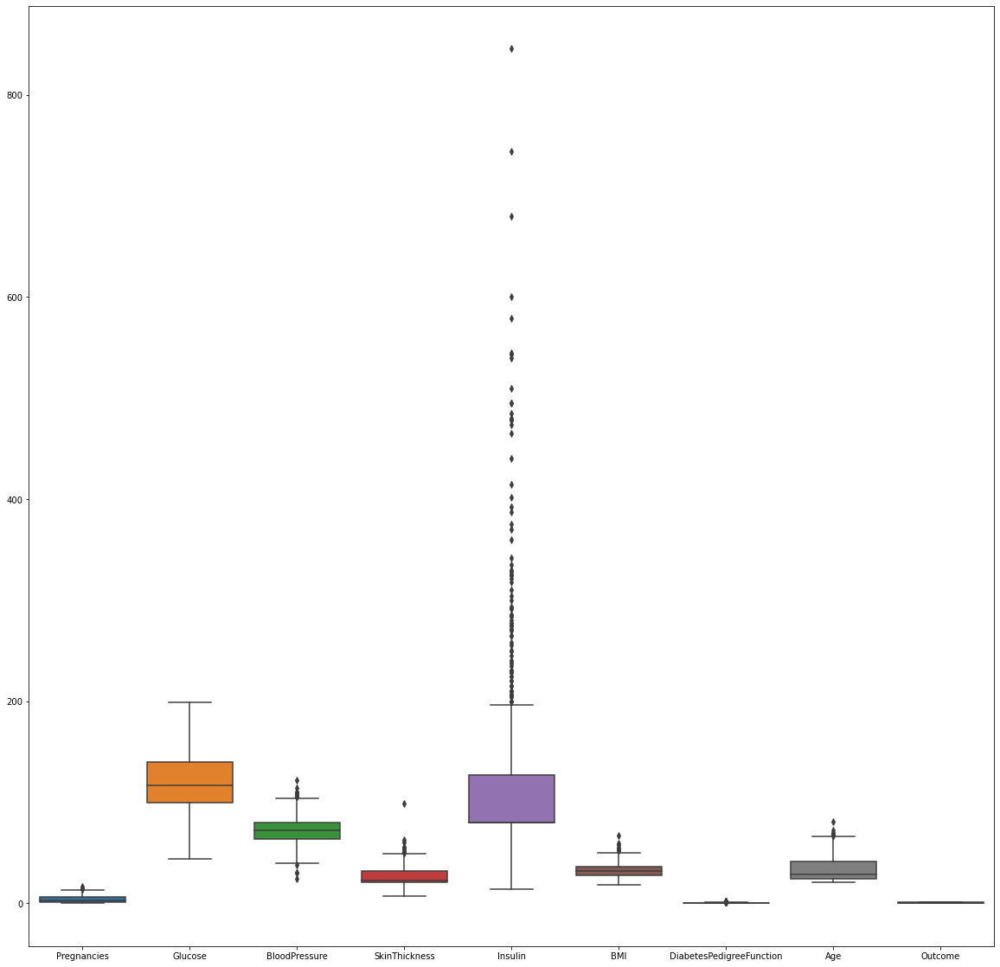

In [7]:
fig,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = df , ax = ax)

### Treating outliers

In [8]:
# Removing 5% of the outliers from the Insulin column
# Checking removal of 10% 
# Treating outliers in Pregnancies
q = df['Pregnancies'].quantile(.98)
df_new = df[df['Pregnancies'] < q]

# Treating outliers in BMI
q = df_new['BMI'].quantile(.99)
df_new = df_new[df_new['BMI'] < q]

# Treating outliers in SkinThickness
q = df_new['SkinThickness'].quantile(.99)
df_new = df_new[df_new['SkinThickness'] < q]

# Treating outliers in Insulin
q = df_new['Insulin'].quantile(.95)
df_new = df_new[df_new['Insulin'] < q]

# Treating outliers in Insulin
q = df_new['Age'].quantile(.99)
df_new = df_new[df_new['Age'] < q]
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<AxesSubplot:>

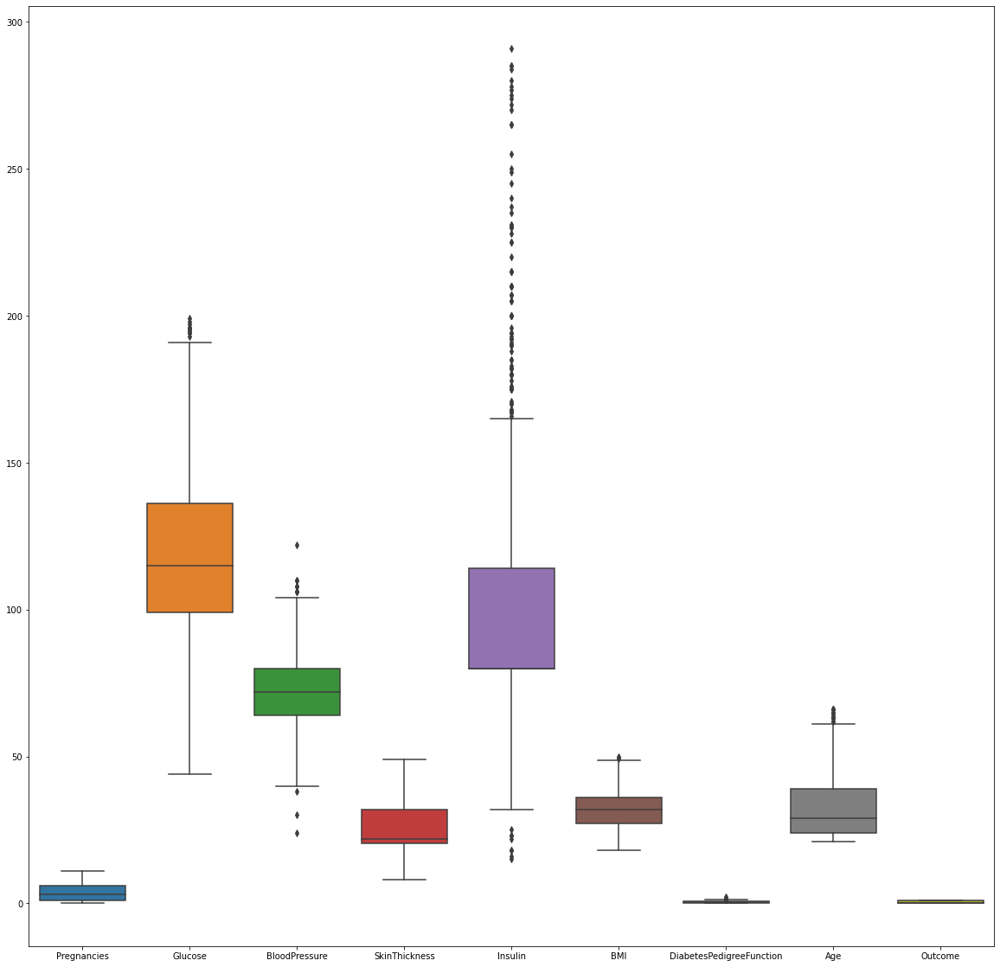

In [9]:
fig,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new , ax = ax)

In [10]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Splitting X,y

In [11]:
y = df_new['Outcome']
X = df_new.drop(columns=['Outcome'])

In [12]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 681, dtype: int64

### Standarizing df

In [13]:
scaler = StandardScaler()
#ProfileReport(pd.DataFrame(scaler.fit_transform(df_new)))

<AxesSubplot:>

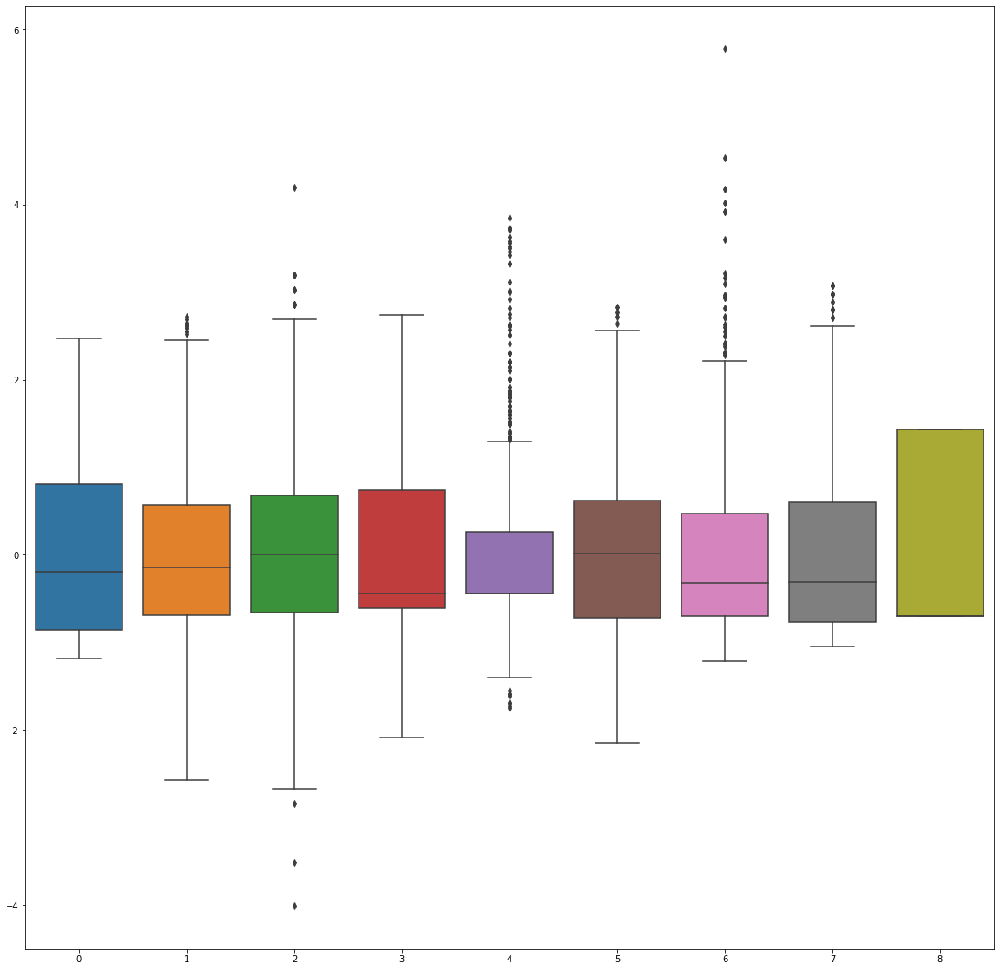

In [15]:
X_scaled = pd.DataFrame(scaler.fit_transform(df_new))
fig,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = X_scaled , ax = ax)

### Multicolinearity check

In [ ]:
X_scaled = scaler.fit_transform(df_new)

In [ ]:
def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns=["FEATURE", "VIF_SCORE"])

In [ ]:
vif_score(X)

No columns has VIF more than 10. No need to remove any column. 

### Train/test split, Model building

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=.20, random_state=144)

In [ ]:
log_reg = LogisticRegression(verbose=1)

In [ ]:
log_reg.fit(X_train, y_train)

In [ ]:
X_test[0]

In [ ]:
# Testing predictions

In [ ]:
log_reg.predict([X_test[0]])

In [ ]:
y_test.iloc[0]

In [ ]:
# Prediction probability of X_test[0]
log_reg.predict_proba([X_test[0]])

In [ ]:
# Experimenting with hyperparmeters 
# Creating another model with solver 'liblinear'
log_reg_lib = LogisticRegression(verbose=1, solver='liblinear')
log_reg_lib.fit(X_train, y_train)

In [ ]:
# Checking accuracy of both models
# Plotting confusion matrices

In [ ]:
y_pred_lib_linear = log_reg_lib.predict(X_test)

In [ ]:
y_pred_log_reg = log_reg.predict(X_test)

In [ ]:
confusion_matrix(y_test, y_pred_lib_linear)

In [ ]:
confusion_matrix(y_test, y_pred_log_reg)

In [ ]:
roc_auc_score(y_test, y_pred_lib_linear)

In [ ]:
roc_auc_score(y_test, y_pred_log_reg)

In [ ]:
fpr, tpr, thresholds  = roc_curve(y_test,y_pred_lib_linear)
auc = roc_auc_score(y_test,y_pred_lib_linear)

In [ ]:
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

> Can't find why the model predicts with 100% accuracy. Model was trained on the training data. Maybe upon feeding more data it will results in more errors in predictions. 